# Load Functions

## 0. imports

In [ ]:
from reportlab.lib.styles import ParagraphStyle, getSampleStyleSheet
from reportlab.lib.pagesizes import A4
from reportlab.lib import colors
from reportlab.platypus import SimpleDocTemplate, Paragraph, Spacer, Table, TableStyle, Image
from reportlab.lib.utils import ImageReader
import os
import io
# import mne
# import json

from utils import *
from eeg_qc import compute_eeg_pipeline, test_eeg_pipeline
from ecg_qc import ecg_qc 
from eda_qc import eda_qc
from rsp_qc import *
from mic_qc import *
from lsl_problem import *
from et_qc import *
from webcam_qc import *
from behavior_qc import *
from generate_csv import *
# import matplotlib

In [2]:
# subject = "P5943825"
# xdf_filename = f'/Users/bryan.gonzalez/CUNY_subs/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'

subject = "P5882302"
xdf_filename = f'/Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'
#xdf_filename = f'/Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'

# subject = "P5597531"
# xdf_filename =  f'/Users/apurva.gokhe/Documents/CUNY_QC/data/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_MOBI.xdf'

video_filename = '/'.join(xdf_filename.split('/')[:-1])+ f'/sub-{subject}_task-CUNY_run-001_video.avi'


## Stim + Behavior

In [3]:
stim_df = import_stim_data(xdf_filename)

In [4]:
error_log = []

In [5]:
behavior_vars, behavior_error = behavior_qc(xdf_filename, stim_df)

Missing stimulus markers: None
Duration of experiment: 39:57
Durations do not match expected length: ['Onset_CampFriend', 'Onset_FrogDissection', 'Onset_DanceContest', 'Onset_ZoomClass', 'Onset_Tornado', 'Onset_BirthdayParty']
299.999547179963
Is Resting state of expected duration? True
300.50497861159965
Is Social script of expected duration? True
Duration of Impedance check: 07:30
Are all 10 seconds rest equal? True
Average response time across all story listening tasks: 00:28


In [6]:
if behavior_error and 'Offset_Experiment' in behavior_vars['missing_stimulus_markers']:
    behavior_print = {'Missing data error': f"Missing stimulus markers including Offset_Experiment for participant {subject} in {xdf_filename}.", 
                      'Missing stimulus markers': behavior_vars['missing_stimulus_markers']}
    error_log.append(behavior_print['Missing data error'])

# if missing stim markers but not missing Offset Experiment
elif behavior_error:
    behavior_print = {'Missing data error': f"Missing stimulus markers for participant {subject} in {xdf_filename}.", 
                      'Missing stimulus markers': behavior_vars['missing_stimulus_markers']}
    error_log.append(behavior_print['Missing data error'])
else:
    behavior_print = {
        "Missing stimulus marker": behavior_vars['missing_stimulus_markers'],
        "Duration of experiment": behavior_vars['total_duration'],
        "Durations do not match expected length": behavior_vars['unexpected_durations'],
        "Duration of impedence check": behavior_vars['impedance_check_duration'],
        "Are all 10 seconds rest equal?": behavior_vars['ten_seconds_rest'],
        "Average response time across all story listening task": behavior_vars['average_response_time']
    }

In [7]:
error_log

[]

# Get Metrics

## 1. EEG

In [8]:
#Compute the eeg vars
eeg_vars, eeg_df, eeg_error = compute_eeg_pipeline(xdf_filename, 
                                                          stim_df=stim_df, 
                                                          task='RestingState')


Opening raw data file /Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-P5882302/sub-P5882302_ses-S001_task-CUNY_run-001_eeg_clean.fif...
    Range : 0 ... 299988 =      0.000 ...   299.998 secs
Ready.
Reading 0 ... 299988  =      0.000 ...   299.998 secs...
Bad channels before robust reference: ['E106', 'E55', 'E6', 'Cz', 'E7']
Interpolated channels: ['E56', 'E106', 'E61', 'E89', 'E126', 'E74', 'Cz', 'E127', 'E7', 'E82']
Bad channels after interpolation: []


In [9]:
if eeg_error:
    eeg_print = f'No EEG data was found for participant {subject} in {xdf_filename}.'
    error_log.append(eeg_print)
else:
    eeg_print = {
        "Event": ("event", f'{eeg_vars["event"]}'),
        "Bad channels before robust reference": ("bad_channels_before", eeg_vars["bad_channels_before"]), 
        "Interpolated channels": ("interpolated_channels", eeg_vars["interpolated_channels"]), 
        "Bad channels after interpolation": ("bad_channels_after", eeg_vars["bad_channels_after"]), 
        "Percent Good before artifact removal": ("percent_good", f'{eeg_vars["percent_good"]:.4}%'),
        "Artifactual Components Excluded": ("excluded_components", f'{eeg_vars["excluded_components"]}')
    }

## 2. ECG

Effective sampling rate: 999.7872778660745
Percent missing data: 0.0000%
Average heart rate: 76.83019740476108
Kurtosis signal quality index: 9.447244789202726
Power spectrum distribution signal quality index: 0.7386379549179376
Relative power in baseline signal quality index: 19.11755089639917
Signal to Noise Ratio: 9.129206971703915


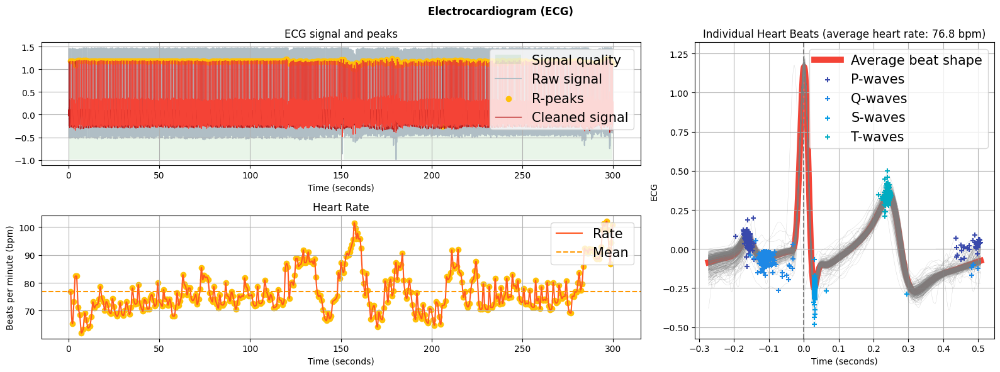

In [ ]:
[ecg_vars, ps_df, ecg_error] = ecg_qc(xdf_filename = xdf_filename, stim_df = stim_df, task='RestingState')

In [ ]:
if ecg_error:
    ecg_print = f"No ECG data was found for participant {subject} in {xdf_filename}."
    error_log.append(ecg_print)
else:
    ecg_print = {
        "Event": ("event", f'{ecg_vars["event"]}'),
        "Effective sampling rate": ("sampling_rate", f'{ecg_vars["sampling_rate"]:.4f} Hz'), 
        "Percent of data missing": ("percent_missing", f'{eda_vars["percent_missing"]:.4}%'),
        "Signal to Noise Ratio": ("SNR", f'{ecg_vars["SNR"]:.4f} dB'),
        "Average heart rate": ("average_heart_rate", f'{ecg_vars["average_heart_rate"]:.4f} bpm'),
        "Kurtosis signal quality index (kSQI)": ("kurtosis_SQI", f'{ecg_vars["kurtosis_SQI"]:.4f}'),
        "Power spectrum distribution (pSQI)": ("power_spectrum_distribution_SQI", f'{ecg_vars["power_spectrum_distribution_SQI"]:.4f} mV²/Hz'),
        "Relative power in baseline (basSQI)": ("relative_baseline_power_sqi", f'{ecg_vars["relative_baseline_power_sqi"]:.4f}%')
    }

## 3. EDA

Effective sampling rate: 999.787 Hz
Signal Integrity Check: 100.000 %
Average Skin Conductance Level: 3.454 mS
Skin Conductance Level Standard deviation: 0.926 mS
Skin Conductance Level Coefficient of Variation: 26.802 %
Average Amplitude of Skin Conductance Response: 0.012 mS
Skin Conductance Response Validity: 33.333 %
Signal to Noise Ratio: 54.191 dB


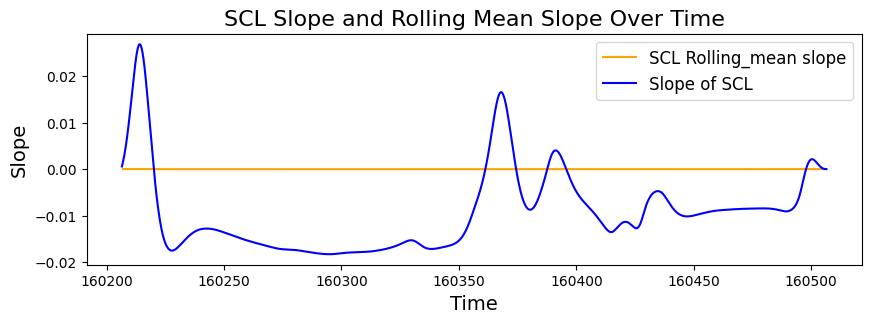

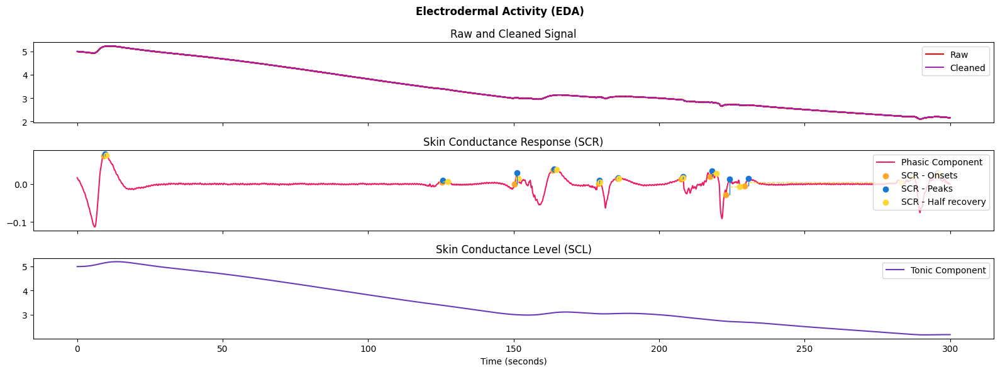

In [ ]:
[eda_vars, ps_df, eda_error] = eda_qc(xdf_filename = xdf_filename, stim_df = stim_df, task= 'RestingState')

In [ ]:
if eda_error:
    eda_print = f"No EDA data was found for participant {subject} in {xdf_filename}."
    error_log.append(eda_print)
else:
    eda_print = {
        "Event": ("event", f'{eda_vars["event"]}'),
        "Effective sampling rate": ("sampling_rate", f'{eda_vars["sampling_rate"]:.4f} Hz'), 
        "Percent of data missing:" ("percent_missing", f'{eda_vars["percent_missing"]:.4}%')
        "Signal to noise ratio": ("snr", f'{eda_vars["snr"]:.4f} dB'),
        "Signal integrity check": ("signal_integrity_check", f'{eda_vars["signal_integrity_check"]:.4f}%'),
        "Average skin conductance level": ("average_scl", f'{eda_vars["average_scl"]:.4f} mS'),
        "Skin conductance level std": ("scl_sd", f'{eda_vars["scl_sd"]:.4f} mS'),
        "Skin conductance level coefficient of variation": ("scl_cv", f'{eda_vars["scl_cv"]:.4f}%'),
        "Average amplitude of skin conductance response": ("average_scr_amplitude", f'{eda_vars["average_scr_amplitude"]:.4f} mS'),
        "Skin conductance response validity": ("scr_validity", f'{eda_vars["scr_validity"]:.4f}%')
    }

## 4. RSP

Effective sampling rate: 999.7873
Percent missing data: 0.0000%
Signal to Noise Ratio: 1.0062
Breath amplitude mean: 0.3026
Breath amplitude std: 0.2149
Breath amplitude range: 0.0695 - 0.9800
Respiration rate mean: 18.6915
Respiration rate std: 2.4423
Respiration rate range: 10.1855 - 25.4610
Peak to peak interval mean: 3.3323
Peak to peak interval std: 0.6694
Peak to peak interval range: 1.4683 - 5.3591
Baseline drift: 0.1319
Autocorrelation at typical breath cycle: 0.3575


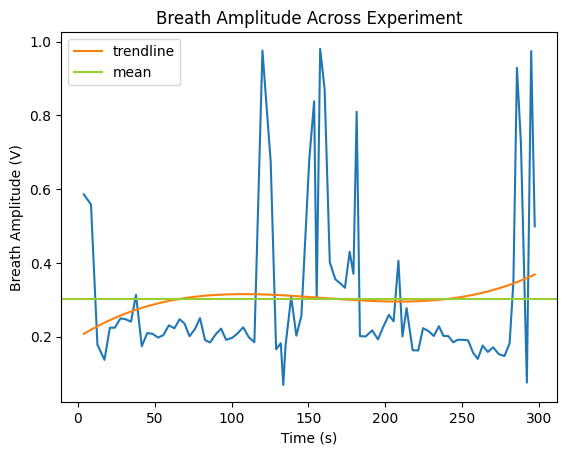

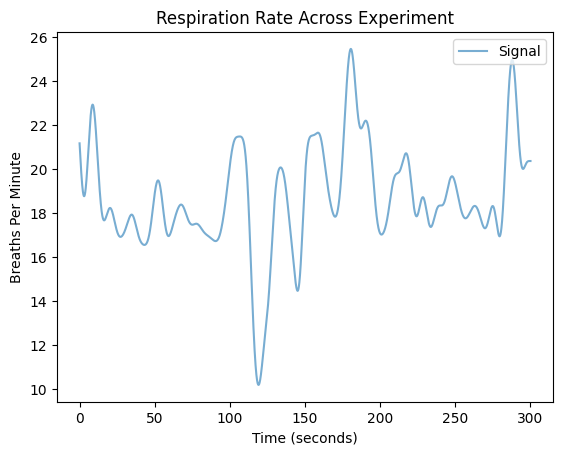

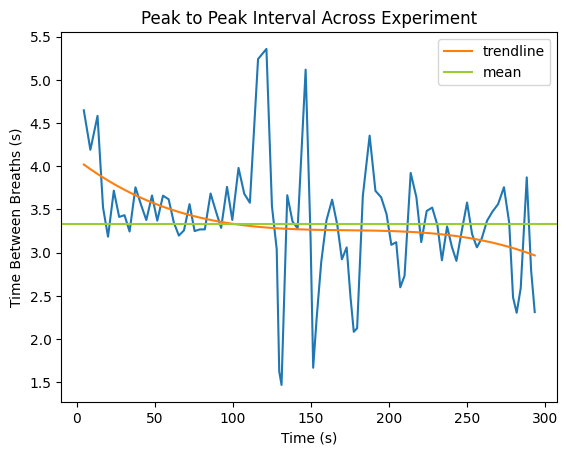

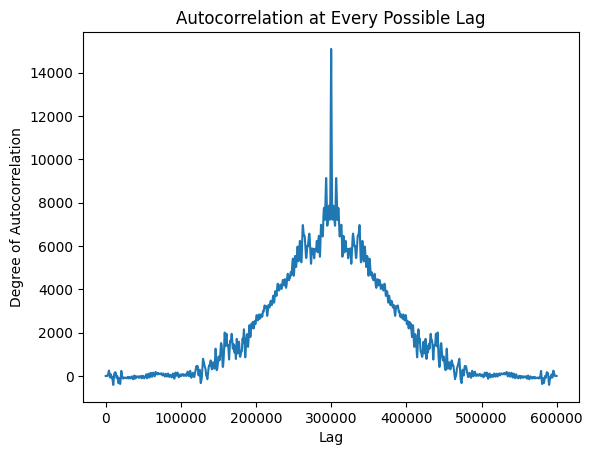

In [133]:
rsp_vars, ps_df, rsp_error = rsp_qc(xdf_filename=xdf_filename, stim_df=stim_df, task='RestingState')

In [121]:
modality_vars['rsp']

{'rsp_event': 'RestingState',
 'rsp_sampling_rate': np.float64(999.7872778660745),
 'rsp_percent_missing': np.float64(0.0),
 'rsp_breath_amplitude_mean': np.float64(0.30259324849609387),
 'rsp_breath_amplitude_std': np.float64(0.21490390041354257),
 'rsp_breath_amplitude_min': np.float64(0.06949252201749681),
 'rsp_breath_amplitude_max': np.float64(0.9800015661952625),
 'rsp_ptp_mean': np.float64(3.332254317480957),
 'rsp_ptp_std': np.float64(0.6694419903491791),
 'rsp_ptp_min': np.float64(1.468312350771157),
 'rsp_ptp_max': np.float64(5.3591400377627),
 'rsp_baseline_drift': np.float64(0.13190179315783387),
 'rsp_autocorrelation': np.float64(0.3575485466625002)}

In [171]:
if rsp_error:
    rsp_print = f"No RSP data was found for participant {subject} in {xdf_filename}."
    error_log.append(rsp_print)
else:
    rsp_print = {
        "Event": ("event", f'{rsp_vars["event"]}'),
        "Effective sampling rate": ("sampling_rate", f'{rsp_vars["sampling_rate"]:.4f} Hz'), 
        "Signal to noise ratio": ("rsp_snr", f'{rsp_vars["rsp_snr"]:.4f} dB'),
        "Breath amplitude mean": ("breath_amplitude_mean", f'{rsp_vars["breath_amplitude_mean"]:.4f} V'),
        "Breath amplitude std": ("breath_amplitude_std", f'{rsp_vars["breath_amplitude_std"]:.4f} V'),
        "Breath amplitude min": ("breath_amplitude_min", f'{rsp_vars["breath_amplitude_min"]:.4f} V'),
        "Breath amplitude max": ("breath_amplitude_max", f'{rsp_vars["breath_amplitude_max"]:.4f} V'),
        "Respiration rate mean": ("rsp_rate_mean", f'{rsp_vars["rsp_rate_mean"]:.4f} bpm'),
        "Respiration rate std": ("rsp_rate_std", f'{rsp_vars["rsp_rate_std"]:.4f} bpm'), 
        "Respiration rate min": ("rsp_rate_min", f'{rsp_vars["rsp_rate_min"]:.4f} bpm'), 
        "Respiration rate max": ("rsp_rate_max", f'{rsp_vars["rsp_rate_max"]:.4f} bpm'), 
        "Peak to peak interval mean": ("ptp_mean", f'{rsp_vars["ptp_mean"]:.4f} sec'), 
        "Peak to peak interval std": ("ptp_std", f'{rsp_vars["ptp_std"]:.4f} sec'), 
        "Peak to peak interval min": ("ptp_min", f'{rsp_vars["ptp_min"]:.4f} sec'), 
        "Peak to peak interval max": ("ptp_max", f'{rsp_vars["ptp_max"]:.4f} sec'), 
        "Baseline drift": ("baseline_drift", f'{rsp_vars["baseline_drift"]:.4f} V'), 
        "Autocorrelation at typical breath cycle": ("autocorrelation", f'{rsp_vars["autocorrelation"]:.4f}')
    }

## 5. Mic

Effective sampling rate: 44099.2862
Difference between .wav file and lsl timestamps durations: 32.6990
number of NaN's: 0 
percent of NaN's: 0.0000%
mic samples first quartile: -46.0 
mic samples third quartile: 45.0
mic samples standard deviation: 160.5741
mic samples min: -10403 
mic samples max: 10068


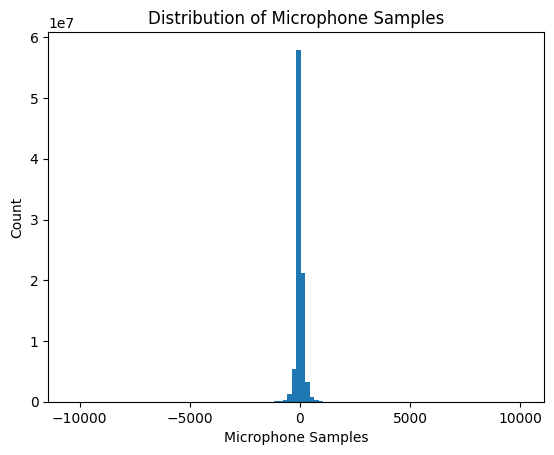

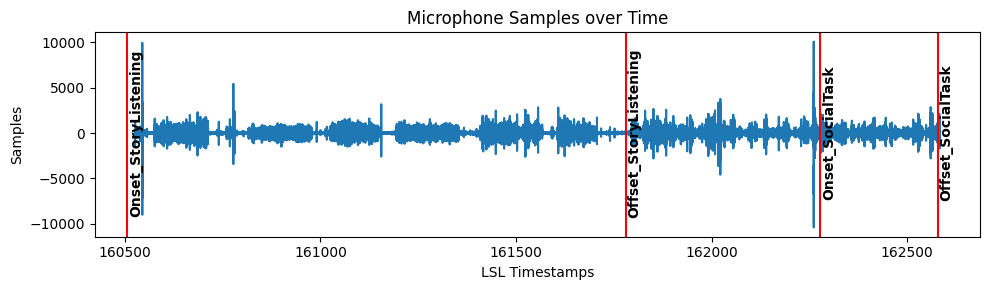

In [16]:
mic_vars, mic_df, mic_error = mic_qc(xdf_filename=xdf_filename, stim_df=stim_df)

In [17]:
if mic_error:
    mic_print = f"No mic data was found for participant {subject} in {xdf_filename}."
    error_log.append(mic_print)

else:
    mic_print = {
        "Event": ("event", f'{mic_vars["event"]}'),
        "Effective sampling rate": ("sampling_rate", f'{mic_vars["sampling_rate"]:.4f} Hz'), 
        "Difference between .wav file and lsl timestamps durations": ("lsl_wav_duration_diff", f'{mic_vars["lsl_wav_duration_diff"]:.4f} sec'), 
        "Number of NaN's": ("num_NaN", f'{mic_vars["num_NaN"]}'),
        "Percent of NaN's": ("percent_NaN", f'{mic_vars["percent_NaN"]:.4f}%'),
        "Mic samples first quartile": ("quan25", f'{mic_vars["quan25"]:.4f}'),
        "Mic samples third quartile": ("quan75", f'{mic_vars["quan75"]:.4f}'),
        "Mic samples std": ("std", f'{mic_vars["std"]:.4f}'),
        "Mic samples min": ("min", f'{mic_vars["min"]:.4f}'),
        "Mic samples max": ("max", f'{mic_vars["max"]:.4f}')
        }

## 6. Webcam

RestingState duration matches camera duration!
RestingState:  299.999547179963
Webcam Stream:  299.99179364927113


[mpeg4 @ 0x15dac83a0] ac-tex damaged at 3 18
[mpeg4 @ 0x15dac83a0] Error at MB: 741
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is no keyframe
[mpeg4 @ 0x15af5b130] warning: first frame is 

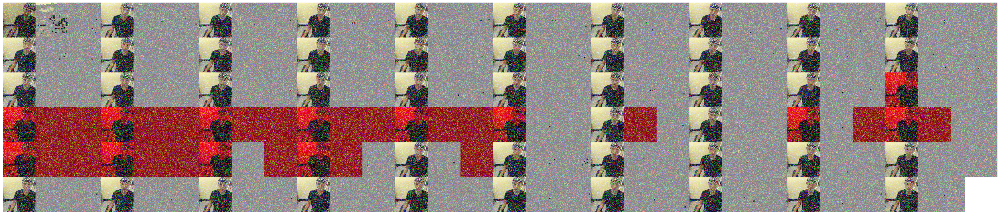

In [18]:
webcam_vars, webcam_df, webcam_error = webcam_qc(xdf_filename=xdf_filename,
                                stim_df=stim_df,
                                video_file=video_filename, task='RestingState')

In [19]:
if webcam_error:
    webcam_print = f"No webcam data was found for participant {subject} in {xdf_filename}."
    error_log.append(webcam_print)
else:
    webcam_print = {
        "Event": ("event", f'{webcam_vars["event"]}'),
        "Effective sampling rate": ("sampling_rate", f'{webcam_vars["sampling_rate"]:.4f} Hz'), 
        "Collected full resting state": ("collected_full_RestingState", webcam_vars["collected_full_RestingState"]), 
        "Percent of frames with face detected": ("face_perc", f'{webcam_vars["face_perc"]:.4}%')
    }

## 7. ET

Effective sampling rate: 119.9959
Percent invalid data in left gaze point: 19.48%
Percent invalid data in right gaze point: 23.64%
Percent invalid data in left gaze origin: 16.9%
Percent invalid data in right gaze origin: 22.51%
Percent invalid data in left pupil diameter: 19.48%
Percent invalid data in right pupil diameter: 23.64%
Flag: all coordinates have the same % validity within each measure (LR, gaze point/origin/diameter): True
Flag: % of NaNs is the same between coordinate systems (UCS and TBCS (gaze origin) and between UCS and display area (gaze point)): True
Mean difference in percent valid data between right and left eyes: 4.89%
Percent of data with gaze point differences of over 0.2 mm: 12.11%


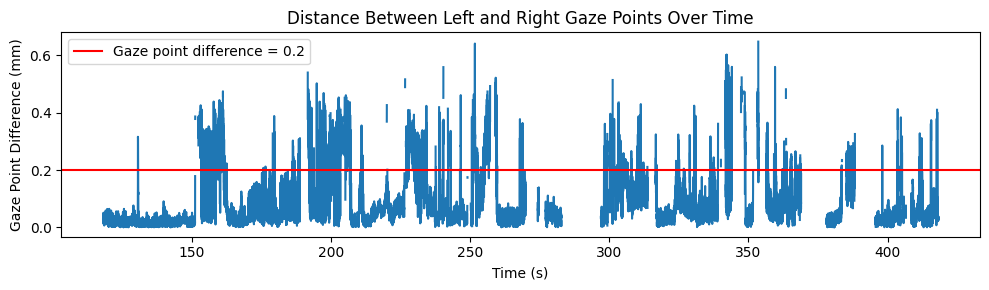

In [ ]:
et_vars, et_df, et_error = et_qc(xdf_filename = xdf_filename, stim_df = stim_df, task='Experiment')

In [21]:
if et_error == 'no_data':
    et_print = f"No ET data was found for participant {subject} in {xdf_filename}."
    error_log.append(et_print)
else:
    et_print = {
        "Event": ("event", f'{et_vars["event"]}'),
        "Effective sampling rate": ("sampling_rate", f'{et_vars["sampling_rate"]:.4f} Hz'), 
        "Percent invalid data in left gaze point": ("left_gaze_point_invalid", f'{et_vars["left_gaze_point_invalid"]:.4}%'),
        "Percent invalid data in right gaze point": ("right_gaze_point_invalid", f'{et_vars["right_gaze_point_invalid"]:.4}%'),
        "Percent invalid data in left gaze origin": ("left_gaze_origin_invalid", f'{et_vars["left_gaze_origin_invalid"]:.4}%'),
        "Percent invalid data in right gaze origin": ("right_gaze_origin_invalid", f'{et_vars["right_gaze_origin_invalid"]:.4}%'),
        "Percent invalid data in left pupil diameter": ("left_pupil_invalid", f'{et_vars["left_pupil_invalid"]:.4}%'),
        "Percent invalid data in right pupil diameter": ("right_pupil_invalid", f'{et_vars["right_pupil_invalid"]:.4}%'),
        "Flag: all coordinates have the same % validity within each measure (LR, gaze point/origin/diameter)": ("xyz_measures_check", et_vars["xyz_measures_check"]), 
        "Flag: % of NaNs is the same between coordinate systems (UCS and TBCS (gaze origin) and between UCS and display area (gaze point))": ("coordinate_system_check", et_vars["coordinate_system_check"]),
        "Mean difference in percent valid data between right and left eyes": ("LR_mean_diff", f'{et_vars["LR_mean_diff"]:.4f}%'),
        "Percent of data with gaze point differences of over 0.2 mm": ("percent_over02", f'{et_vars["percent_over02"]:.4f}%')
        }
if et_error == 'missing_data':
    error_log.append(f"Significant amount of ET data missing for participant {subject} in {xdf_filename}.")
    et_print["Percent of data with gaze point differences of over 0.2 mm"] = float('nan')


## Stream Durations 

### functions are in utils.py (but should be called in the report)

In [22]:
ps_error = False
if ecg_error + eda_error + rsp_error == 3:
    ps_error = True

In [23]:
df_map = {
    'et': et_df,
    'ps': ps_df,
    'mic': mic_df,
    'cam': webcam_df,
    'eeg': eeg_df
    }

error_map = {
    'et': et_error,
    'ps': ps_error,
    'mic': mic_error,
    'cam': webcam_error,
    'eeg': eeg_error
    }

In [24]:
duration_vars = {"Durations of each modality + comparison to expected duration:": 
    get_durations(xdf_path=xdf_filename, task='Experiment', stim_df = stim_df, df_map = df_map, error_map = error_map)}

et is shorter than expected for Experiment by 866.3223 seconds
mic is shorter than expected for Experiment by 340.8073 seconds

Experiment DataFrame


In [25]:
duration_print = duration_vars

In [26]:
# i wont run these but they are here for reference
# get_durations('RestingState', xdf_filename)
# get_durations('CampFriend', xdf_filename)
# get_durations('SocialTask', xdf_filename)
# whole_durations(xdf_filename, stim_df, df_map, error_map)

## LSL Problem

In [27]:
lsl_vars = lsl_problem_qc(xdf_filename, stim_df=stim_df, df_map=df_map, error_map = error_map)

    subject stream  num_losses  percent_lost
1  P5882302     ps           1        0.4797
0  P5882302     et           0        0.0000
2  P5882302    mic           0        0.0000
3  P5882302    cam           0        0.0000
4  P5882302    eeg           0        0.0000
    subject stream  num_losses  percent_lost
0  P5882302     et           1       34.5945
1  P5882302     ps           1        0.4988
2  P5882302    mic           0        0.0000
3  P5882302    cam           0        0.0000
4  P5882302    eeg           0        0.0000


In [ ]:
# lsl_print = {
#     "Percent of missing data in entire experiment": lsl_vars["percent_loss"],
#     "Percent of missing data before social task offset": lsl_vars["loss_before_social_task"]
# }

In [ ]:
lsl_vars_unpacked, duration_vars_unpacked = unpack_vars(lsl_vars, duration_vars)

In [ ]:
lsl_print = {
    "Number of physio lsl losses": ("ps_num_losses", f'{lsl_vars_unpacked["ps_num_losses"]}'),
    "Percent of physio lsl loss": ("ps_percent_lost", f'{lsl_vars_unpacked["ps_percent_lost"]:.4}%'),
    "Number of et lsl losses": ("et_num_losses", f'{lsl_vars_unpacked["et_num_losses"]}'),
    "Percent of et lsl loss": ("et_percent_lost", f'{lsl_vars_unpacked["et_percent_lost"]:.4}%'),
    "Number of mic lsl losses": ("mic_num_losses", f'{lsl_vars_unpacked["mic_num_losses"]}'),
    "Percent of mic lsl loss": ("mic_percent_lost", f'{lsl_vars_unpacked["mic_percent_lost"]:.4}%'),
    "Number of webcam lsl losses": ("cam_num_losses", f'{lsl_vars_unpacked["cam_num_losses"]}'),
    "Percent of webcam lsl loss": ("cam_percent_lost", f'{lsl_vars_unpacked["cam_percent_lost"]:.4}%'),
    "Number of eeg lsl losses": ("eeg_num_losses", f'{lsl_vars_unpacked["eeg_num_losses"]}'),
    "Percent of eeg lsl loss": ("eeg_percent_lost", f'{lsl_vars_unpacked["eeg_percent_lost"]:.4}%')
}

In [ ]:
duration_print = {
    "ET duration": ("et_duration", f'{duration_vars_unpacked["et_duration"]:.4f} s'),
    "ET percent": ("et_percent", f'{duration_vars_unpacked["et_percent"]:.4}%'),
    "MIC duration": ("mic_duration", f'{duration_vars_unpacked["mic_duration"]:.4f} s'),
    "MIC percent": ("mic_percent", f'{duration_vars_unpacked["mic_percent"]:.4}%'),
    "CAM duration": ("cam_duration", f'{duration_vars_unpacked["cam_duration"]:.4f} s'),
    "CAM percent": ("cam_percent", f'{duration_vars_unpacked["cam_percent"]:.4}%'),
    "Physio duration": ("ps_duration", f'{duration_vars_unpacked["ps_duration"]:.4f} s'),
    "Physio percent": ("ps_percent", f'{duration_vars_unpacked["ps_percent"]:.4}%'),
    "EEG duration": ("eeg_duration", f'{duration_vars_unpacked["eeg_duration"]:.4f} s'),
    "EEG percent": ("eeg_percent", f'{duration_vars_unpacked["eeg_percent"]:.4}%'),
    "Expected duration": ("expected_duration", f'{duration_vars_unpacked["expected_duration"]:.4f} s'),
    "Expected percent": ("expected_percent", "100.0%")
}

In [ ]:
duration_print_table = duration_vars

In [ ]:
# find a better solution if we do this
duration_print_table = {
    'Durations of each modality + comparison to expected duration:': ("whatever", duration_vars["Durations of each modality + comparison to expected duration:"])    
}

In [ ]:
lsl_print_table = {
    # "Percent of missing data in entire experiment:": ("percent_loss", lsl_vars["percent_loss"]),
    "Percent of missing data before social task offset:": ("loss_before_social_task", lsl_vars["loss_before_social_task"])
}

# Add to CSV/Make IQR Plot

In [ ]:
unnamed_modality_vars = {
    'eeg': eeg_vars, 
    'et': et_vars, 
    'ecg': ecg_vars, 
    'eda': eda_vars, 
    'rsp': rsp_vars, 
    'mic': mic_vars, 
    'cam': webcam_vars,
    'lsl': lsl_vars_unpacked, 
    'duration': duration_vars_unpacked
    }

def add_modality_name(modality_vars):
    for key, vars in modality_vars.items():
        # if key not in ['duration', 'lsl']:
        new_vars = {(f"{key}_{k}" if (key not in k) or key == 'duration' else k): value for k, value in vars.items()} # THIS IS IMPORTANT
        modality_vars[key] = new_vars

    return modality_vars

    
modality_vars = add_modality_name(unnamed_modality_vars)

generate_csv(xdf_filename, modality_vars)

In [ ]:
def make_iqr_plot(variable):
    if os.path.exists('CUNY_QC.csv') == False:
        return 'QC metric csv file does not exist.'
    else:
        qc_csv = pd.read_csv('CUNY_QC.csv')

        fig, ax = plt.subplots(figsize=(4, 1.5))
        sns.boxplot(x=qc_csv[variable], color="paleturquoise", width=0.2, ax=ax)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        modality = variable.split('_')[0]
        subject_value = modality_vars[modality][variable]
        if isinstance(subject_value, (float, np.floating, int)):
            ax.axvline(subject_value, color="red", linestyle="dotted", linewidth=1)

        ax.text(
            ax.get_xlim()[0], ax.get_ylim()[0],
            f"N={qc_csv.shape[0]}",
            fontsize=10, va="bottom", ha="left"
        )
        ax.set_xlabel(None)
        # ax.set_ylabel(variable)
        plt.tight_layout()

        # Save to memory buffer instead of file
        buf = io.BytesIO()
        fig.savefig(buf, format="png", bbox_inches="tight")
        # fig.show()
        buf.seek(0)
        plt.close(fig)

        # img_buffers.append((variable, modality, buf))

    return buf

In [ ]:
# old
# lsl prob and duration are in here as unpacked individual metrics
# if behavior_error: 
#     all_print_dicts = {
#         'Behavior': behavior_print
#     }
# else:
#     all_print_dicts = {
#         "eeg": eeg_print,
#         "ecg": ecg_print,
#         "eda": eda_print,
#         "rsp": rsp_print,
#         "mic": mic_print,
#         "et": et_print,
#         "cam": webcam_print,
#         "lsl": lsl_print, 
#         "duration": duration_print
#     }

# # PDF structure
# parent_folder = xdf_filename.split('mobi')[0]
# pdf_path = f"{parent_folder}_OLD.pdf"
# doc = SimpleDocTemplate(pdf_path, pagesize=A4)
# elements = []
# styles = getSampleStyleSheet()

# # Define subtitle style if not already done
# subtitle_style = ParagraphStyle(
#     name="Subtitle",
#     parent=styles["Heading2"],
#     fontSize=14,
#     leading=16,
#     textColor="gray",
#     spaceAfter=12,
#     alignment=1  # Centered
# )

# # page number function
# def add_page_number(canvas, doc):
#     page_num = f'{canvas.getPageNumber()}'
#     canvas.setFont("Helvetica", 9)
#     canvas.drawRightString(570, 20, page_num)  # (x, y) from bottom-left


# elements.append(Paragraph(f"Subject Report: {subject}", styles["Title"]))
# elements.append(Paragraph(f"Collection Date: {get_collection_date(xdf_filename)}", subtitle_style))
# elements.append(Spacer(1, 12))

# # Format each metrics dict
# for modality, metric_print_dict in all_print_dicts.items():
#     elements.append(Paragraph(modality.upper(), styles["Heading2"]))
#     for key, (variable, value) in metric_print_dict.items():
#         if modality not in variable or modality == 'duration':# and modality not in ['duration', 'lsl']:
#                 variable = f"{modality}_{variable}"

#         text = f"<b>{key}:</b> {value}" 
#         og_value = modality_vars[modality][variable]
#         if not isinstance(og_value, (float, np.floating, int)): 
#             elements.append(Paragraph(text, styles["Normal"]))
#             elements.append(Spacer(1, 12))
#         else: 
#             # add IQR imgs
#             buffer = make_iqr_plot(modality, variable)
#             image = ImageReader(buffer)
#             orig_width, orig_height = image.getSize()
#             img = Image(buffer, width=orig_width/3, height=orig_height/3)
#             table_data = [[Paragraph(text, styles["Normal"]), img]]
#             table = Table(table_data, hAlign = 'LEFT', colWidths=[250, orig_width/4])
#             table.setStyle(TableStyle([
#                 ('ALIGN', (0,0), (-1,-1), 'LEFT'),
#                 ('VALIGN', (0,0), (-1,-1), 'MIDDLE'),
#                 ('LEFTPADDING', (0,0), (-1,-1), 0),
#                 ('RIGHTPADDING', (0,0), (-1,-1), 6)
#             ]))
#             elements.append(table)
#             elements.append(Spacer(1, 12))

#     # images
#     folder = "report_images"
#     if os.path.exists(folder):
#         row_images = []
#         for fname in sorted(os.listdir(folder)):
#             if modality in fname.lower() and subject in fname:
#                 image_path = os.path.join(folder, fname)
#                 # get dimensions
#                 image_reader = ImageReader(image_path)
#                 orig_width, orig_height = image_reader.getSize()
#                 if orig_width > 4000:
#                     img = Image(image_path, width=orig_width/9, height=orig_height/9)
#                 elif orig_width > 3000:
#                     img = Image(image_path, width=orig_width/7, height=orig_height/7)
#                 elif orig_width > 2000:
#                     img = Image(image_path, width=orig_width/5, height=orig_height/5)
#                 elif orig_width > 1400:
#                     img = Image(image_path, width=orig_width/3, height=orig_height/3)
#                 else:
#                     img = Image(image_path, width=orig_width/2, height=orig_height/2)

#                 # If 'rsp' in image name, add to a row
#                 if 'rsp' in fname.lower():
#                     img.drawWidth = 250
#                     img.drawHeight = 200
#                     row_images.append(img)
                    
#                     if len(row_images) == 2:
#                         table = Table([row_images], hAlign = 'CENTER', colWidths=[280,280])
#                         table.setStyle(TableStyle([('ALIGN', (0, 0), (0, -1), 'LEFT')]))
#                         elements.append(table)
#                         elements.append(Spacer(1, 12))
#                         row_images = []

#                 else:
#                     elements.append(img)
#                     elements.append(Spacer(1, 12))

#         # If there's an unmatched image left in the row buffer
#         if row_images:
#             elements.append(Table([row_images], hAlign='CENTER', colWidths='*'))
#             elements.append(Spacer(1, 12))
#     elements.append(Spacer(1, 12))


# doc.build(elements, onFirstPage = add_page_number, onLaterPages = add_page_number)
# print(f'PDF created: {pdf_path}')

PDF created: /Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-P5882302/sub-P5882302_ses-S001_task-CUNY_run-001_IQR_Plots.pdf


In [113]:
# MOST UP TO DATE
if behavior_error: 
    all_print_dicts = {
        'Behavior': behavior_print
    }
else:
    all_print_dicts = {
        "eeg": eeg_print,
        "ecg": ecg_print,
        "eda": eda_print,
        "rsp": rsp_print,
        "mic": mic_print,
        "et": et_print,
        "cam": webcam_print,
        "lsl": lsl_print_table, 
        "duration": duration_print_table
    }

# PDF structure
parent_folder = xdf_filename.split('mobi')[0]
pdf_path = f"{parent_folder}Report.pdf"
doc = SimpleDocTemplate(pdf_path, pagesize=A4)
elements = []
styles = getSampleStyleSheet()

# Define subtitle style if not already done
subtitle_style = ParagraphStyle(
    name="Subtitle",
    parent=styles["Heading2"],
    fontSize=14,
    leading=16,
    textColor="gray",
    spaceAfter=12,
    alignment=1  # Centered
)

# page number function
def add_page_number(canvas, doc):
    page_num = f'{canvas.getPageNumber()}'
    canvas.setFont("Helvetica", 9)
    canvas.drawRightString(570, 20, page_num)  # (x, y) from bottom-left


elements.append(Paragraph(f"Subject Report: {subject}", styles["Title"]))
elements.append(Paragraph(f"Collection Date: {get_collection_date(xdf_filename)}", subtitle_style))
elements.append(Spacer(1, 12))

# Format each metrics dict
for modality, metric_print_dict in all_print_dicts.items():
    elements.append(Paragraph(modality.upper(), styles["Heading2"]))
    for key, (variable, value) in metric_print_dict.items():
        # elements.append(PageBreak())  # Inserts a page break

        # lsl or duration
        if isinstance(value, pd.DataFrame):
            qc_csv = pd.read_csv('CUNY_QC.csv')
            numeric_cols = qc_csv.select_dtypes(include=['float64', 'int64']).columns
            if modality == "lsl":
                elements.append(PageBreak())
                df_with_plots = value.copy()
                num_losses_idx = df_with_plots.columns.get_loc("num_losses")
                df_with_plots.insert(num_losses_idx + 1, "num_losses IQR", None)
                percent_idx = df_with_plots.columns.get_loc("percent_lost")
                df_with_plots.insert(percent_idx + 1, "percent_lost IQR", None)
                # to put them at the end:
                # df_with_plots["num_losses IQR"] = None  
                # df_with_plots["Percent IQR"] = None  

                for idx, row in df_with_plots.iterrows():
                    matching_col_num_losses = [col for col in numeric_cols 
                                    if f"lsl_{row['stream']}_num_losses" in col] 
                    matching_col_percent = [col for col in numeric_cols 
                                    if f"lsl_{row['stream']}_percent_lost" in col]
                    if matching_col_num_losses:
                        buffer = make_iqr_plot(matching_col_num_losses[0])
                        image = ImageReader(buffer)
                        orig_width, orig_height = image.getSize()
                        img = Image(buffer, width=orig_width/3, height=orig_height/3)
                        df_with_plots.at[idx, "num_losses IQR"] = img
                    if matching_col_percent:
                        buffer = make_iqr_plot(matching_col_percent[0])
                        image = ImageReader(buffer)
                        orig_width, orig_height = image.getSize()
                        img = Image(buffer, width=orig_width/3, height=orig_height/3)
                        df_with_plots.at[idx, "percent_lost IQR"] = img
                
                data = [df_with_plots.columns.tolist()] + df_with_plots.values.tolist()  # Include headers
                dftable = Table(data, repeatRows=1)
                dftable.hAlign = 'LEFT'

                dftable.setStyle(TableStyle([
                    ('BACKGROUND', (0, 0), (-1, 0), colors.lightgrey),
                    ('GRID', (0, 0), (-1, -1), 0.5, colors.black),
                    ('FONTNAME', (0, 0), (-1, -1), 'Helvetica'),
                    ('FONTSIZE', (0, 0), (-1, -1), 10),
                    ('ALIGN', (0, 0), (-1, -1), 'LEFT'),
                ]))
                elements.append(Paragraph(key, styles['Normal']))
                elements.append(Spacer(1, 12))

                elements.append(dftable)
                elements.append(Spacer(1, 12))

            elif modality == "duration":
                df_with_plots = value.copy()
                duration_idx = df_with_plots.columns.get_loc("duration")
                df_with_plots.insert(duration_idx + 1, "duration IQR", None)
                percent_idx = df_with_plots.columns.get_loc("percent")
                df_with_plots.insert(percent_idx + 1, "percent IQR", None)
                # to put them at the end:
                # df_with_plots["Duration IQR"] = None  
                # df_with_plots["Percent IQR"] = None  

                for idx, row in df_with_plots.iterrows():
                    matching_col_duration = [col for col in numeric_cols 
                                    if f"duration_{row['stream']}_duration" in col] 
                    matching_col_percent = [col for col in numeric_cols 
                                    if f"duration_{row['stream']}_percent" in col]
                    if matching_col_duration:
                        buffer = make_iqr_plot(matching_col_duration[0])
                        image = ImageReader(buffer)
                        orig_width, orig_height = image.getSize()
                        img = Image(buffer, width=orig_width/3, height=orig_height/3)
                        df_with_plots.at[idx, "duration IQR"] = img
                    if matching_col_percent:
                        buffer = make_iqr_plot(matching_col_percent[0])
                        image = ImageReader(buffer)
                        orig_width, orig_height = image.getSize()
                        img = Image(buffer, width=orig_width/3, height=orig_height/3)
                        df_with_plots.at[idx, "percent IQR"] = img
                
                data = [df_with_plots.columns.tolist()] + df_with_plots.values.tolist()  # Include headers
                dftable = Table(data, repeatRows=1)
                dftable.hAlign = 'LEFT'

                dftable.setStyle(TableStyle([
                    ('BACKGROUND', (0, 0), (-1, 0), colors.lightgrey),
                    ('GRID', (0, 0), (-1, -1), 0.5, colors.black),
                    ('FONTNAME', (0, 0), (-1, -1), 'Helvetica'),
                    ('FONTSIZE', (0, 0), (-1, -1), 10),
                    ('ALIGN', (0, 0), (-1, -1), 'LEFT'),
                ]))
                elements.append(Paragraph(key, styles['Normal']))
                elements.append(Spacer(1, 12))

                elements.append(dftable)
                elements.append(Spacer(1, 12))
            
            continue
        if modality not in variable:# or modality == 'duration':# and modality not in ['duration', 'lsl']:
                variable = f"{modality}_{variable}"

        text = f"<b>{key}:</b> {value}" 
        og_value = modality_vars[modality][variable]
        if not isinstance(og_value, (float, np.floating, int)): 
            elements.append(Paragraph(text, styles["Normal"]))
            elements.append(Spacer(1, 12))
        else: 
            # add IQR imgs
            buffer = make_iqr_plot(variable)
            image = ImageReader(buffer)
            orig_width, orig_height = image.getSize()
            img = Image(buffer, width=orig_width/3, height=orig_height/3)
            table_data = [[Paragraph(text, styles["Normal"]), img]]
            table = Table(table_data, hAlign = 'LEFT', colWidths=[250, orig_width/4])
            table.setStyle(TableStyle([
                ('ALIGN', (0,0), (-1,-1), 'LEFT'),
                ('VALIGN', (0,0), (-1,-1), 'MIDDLE'),
                ('LEFTPADDING', (0,0), (-1,-1), 0),
                ('RIGHTPADDING', (0,0), (-1,-1), 6)
            ]))
            elements.append(table)
            elements.append(Spacer(1, 12))

    # images
    folder = "report_images"
    if os.path.exists(folder):
        row_images = []
        for fname in sorted(os.listdir(folder)):
            if modality in fname.lower() and subject in fname:
                image_path = os.path.join(folder, fname)
                # get dimensions
                image_reader = ImageReader(image_path)
                orig_width, orig_height = image_reader.getSize()
                if orig_width > 4000:
                    img = Image(image_path, width=orig_width/9, height=orig_height/9)
                elif orig_width > 3000:
                    img = Image(image_path, width=orig_width/7, height=orig_height/7)
                elif orig_width > 2000:
                    img = Image(image_path, width=orig_width/5, height=orig_height/5)
                elif orig_width > 1400:
                    img = Image(image_path, width=orig_width/3, height=orig_height/3)
                else:
                    img = Image(image_path, width=orig_width/2, height=orig_height/2)

                # If 'rsp' in image name, add to a row
                if 'rsp' in fname.lower():
                    img.drawWidth = 250
                    img.drawHeight = 200
                    row_images.append(img)
                    
                    if len(row_images) == 2:
                        table = Table([row_images], hAlign = 'CENTER', colWidths=[280,280])
                        table.setStyle(TableStyle([('ALIGN', (0, 0), (0, -1), 'LEFT')]))
                        elements.append(table)
                        elements.append(Spacer(1, 12))
                        row_images = []

                else:
                    elements.append(img)
                    elements.append(Spacer(1, 12))

        # If there's an unmatched image left in the row buffer
        if row_images:
            elements.append(Table([row_images], hAlign='CENTER', colWidths='*'))
            elements.append(Spacer(1, 12))
    elements.append(Spacer(1, 12))


doc.build(elements, onFirstPage = add_page_number, onLaterPages = add_page_number)
print(f'PDF created: {pdf_path}')

PDF created: /Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-P5882302/sub-P5882302_ses-S001_task-CUNY_run-001_Report.pdf


# Copy

In [ ]:
copy = {
    'EEG': 'Data preprocessed by performing <b>line noise removal</b>, <b>robust referencing</b>, and <b>bad channel detection/interpolation</b> using PyPrep pipeline. First, the pipeline applies a notch filter at 60 Hz and its harmonics to remove power line noise. Then, it performs <b>robust average referencing</b>, where it detects bad channels, interpolates them using surrounding signals, and computes a median-based reference across EEG channels. This ensures a stable reference even in the presence of noisy electrodes. Independent components analysis (ICA) was then performed to identify and remove ocular and muscle artifacts. The final output is a cleaned EEG dataset with a consistent reference, ready for further analysis.',
    'ET': 'In the eye tracking data, gaze origin, gaze point, and pupil diameter are reported, for the left and right eyes. Gaze origin describes the point in 3D space where the gaze vector starts, and is reported in both the user coordinate system (UCS) and the trackbox coordinate system (TBCS). Gaze point describes the spot on the screen where the participant is looking, for each eye. Gaze origin is reported in 3D space in the UCS and the display area. The percent of data for which the distance between the gaze point of the left and right eye is more than 0.2 mm is reported below.',
    'ECG': "The data was processed using the neurokit2 automated pipeline for preprocessing ECG signals. ECG data is cleaned using the default parameters that apply fifth order 0.5 Hz high-pass butterworth filter followed by 50 Hz powerline filtering. Neurokit2 was also used to calculate signal quality indices (SQI) based on Zhao et.al (2018). SQIs calculated were kurtosis (kSQI), power spectrum distribution of QRS wave (pSQI) and relative power in baseline (basSQI). kSQI was calculated using the Fisher's method. pSQI and basSQI were calculated using the Welch method.",
    'EDA': "Electrodermal Activity (EDA) is measured in microSiemens from a standard EDA sensor. EDA data quality metrics calculated from raw and clean data using neurokit2 python package. The data is processed using the neurokit2 automated pipeline for preprocessing EDA signal. EDA data is cleaned using the default parameters that apply fourth order butterworth filter. Additionally, the automated preprocessing pipeline was used to decompose the EDA signal into the tonic component, Skin Conductance Level (SCL) and the phasic component, Skin Conductance Response (SCR). The decomposition was done using default parameters that perform high-pass filtering with a cutoff frequency of 0.05Hz on EDA signal.",
    'RSP': "Respiration data is measured in volts from a piezoelectric sensor. Respiration data quality metrics are calculated both from raw and cleaned data, where the neurokit2 package was used to clean the data using the default method of a second order 0.05-3 Hz bandpass Butterworth filter, as in Khodadad et al, 2018. Neurokit2 was also used to extract the peaks and troughs of detected breaths. Respiration rate was calculated using the cross correlation method, which was more consistent to the raw data than the other trough method. Baseline drift was quantified as the standard deviation of the data after applying a lowpass filter to raw data.",
    'MIC': "For audio data, it is important to confirm that the distribution of microphone samples (see graph below) is relatively centered around 0, with no outlier peaks and no values above 32,000 or below -32,000.",
    'WEBCAM': "The quality of the webcam data is assessed by checking the percentage of frames where a face is detected. If a face is not detected in more than 50 percent of the frames, it may indicate issues with the recording or participant positioning.",
    'Stream Durations': "The following dataframe shows the duration of each data modality for the whole experiment and compares it to the duration calculated from the LSL timestamps of corresponding stimulus markers.",
    'LSL': "While the difference between consecutive LSL time stamps are expected to consistently be equal to the inverse of the sampling rate, it was found that there were longer gaps between some LSL time stamps for some data modalities, indicating a potential system or other technical error during data collection. Below, the percentage of missing data for each data modality due to these LSL time stamp gaps is shown. The amount of data in seconds for each modality is also shown below, and each duration is then compared to the expected duration of the experiment.",
    'BEHAVIOR': "Behavior data metrics were calculated from stimuli markers data."
}